# AGH - Deep Learning in Medical Image Analysis I

Author: Marek Wodziński

Contact: wodzinski@agh.edu.pl

You are allowed to use these materials for all purposes as long as the credit is given.

# Laboratory 8 - Medical Image Generation

## Introduction

The goal of the laboratory is to implement two basic deep architectures dedicated to the medical image generation.

Medical image generation produces synthetic images/volumes based on the previously acquired knowlege (not only images). The generated images may be used for various task, e.g. image augmentation, synthetic-based training, annotation-transfer, domain adaptation or others.

We are going to implement two basic models - the Autoencoder and the Variational Autoencoder. Their performance is far from the state-of-the-art like the famous DALL-E from OpenAI, however, they are good introductory examples.

During the laboratory you are going to use exactly the same dataset as during the Laboratory 5 - the dataset presenting the XRay images of lungs. The dataset can be downloaded from: https://www.kaggle.com/datasets/prashant268/chest-xray-covid19-pneumonia, however, it is recommended to use the previously downloaded files.

The laboratory is splited into two parts - the Laboratory 8 consists of implementing and training Autoencoder and Variational Autoencoder, while the Laboratory 9 (continuation) is dedicated to explore the latent spaces and to implement the Generative Adversarial Networks (GANs).

Let's start with the required libraries:

In [17]:
import os
import numpy as np
import torch as tc
import torchvision as tv
import pandas as pd
import matplotlib.pyplot as plt
!pip install SimpleITK
import SimpleITK as sitk
from torch.utils.tensorboard import SummaryWriter

## Part I - Dataset and Dataloader

Now, similarly to the previous notebooks, let's implement the dedicated dataset. In fact, you are going to use the slightly modified dataset from the Laboratory 5.

First, define the pathes and (optionally, if not done yet) - unzip the dataset.

In [1]:
input_path = None # TODO
output_folder = None # TODO

Now modify the dataset from the Laboratory 5. This time:
<ul>
<li> We are not going to use ResNet18 so it is not mandatory to have three channels. Since the images are 2-D XRay (gray) images, a single channel is enough.
<li> We are not interested in the image labels, just the images themselves. Therefore, the class mapper is not necessary. The dataset should return only the loaded and preprocessed image (1x224x224 normalized to [0-1] range).
</ul>

In [23]:
class XRayDataset(tc.utils.data.Dataset):
    def __init__(self, dataset_path, csv_path):
        self.dataset_path = dataset_path
        self.csv_path = csv_path
        self.dataset_path = dataset_path
        self.dataframe = pd.read_csv(self.csv_path)

    def __len__(self):
        return None # TODO

    def __getitem__(self, idx):
        current_case = self.dataframe.iloc[idx]
        pass # TODO
        current_image = None # TODO
        return current_image

Now create the .csv file (similarly to the Laboratory 5), however, this time merge all the datasets together. We are not going to split the dataset into training, validation, and test sets because this time we are not interested in generalizability into previously unseen cases, but the quality of the generated images. Of course, if the method would be used to e.g. perform the image augmentation, then the validation / testing datasets used for classification should not be used during training the generative network dedicated to the image augmentation.

Create the .csv file containing just a single column: Image Path

In [26]:
csv_path = None # TODO
data_path = os.path.join(output_folder, "Data")
path_to_training_set = os.path.join(data_path, "train")
path_to_testing_set = os.path.join(data_path, "test")

dataset = []
pass # TODO

dataframe = pd.DataFrame(dataset, columns=["Image Path"])
dataframe.to_csv(csv_path, index=False)
print(f"Dataset size: {len(dataframe)}")

Dataset size: 6432


Check whether the implemented dataset works correctly and prepare visualization similar to the one from Laboratory 5:

Dataset size: 6432


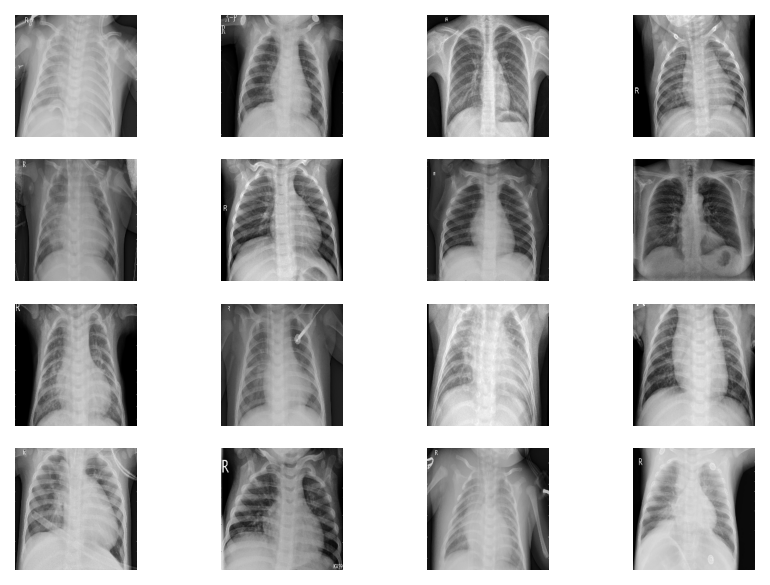

In [27]:
batch_size = 16
shuffle = True
dataset = XRayDataset(data_path, csv_path)
dataloader = tc.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=shuffle)

print(f"Dataset size: {len(dataset)}")

for images in dataloader:
    pass # TODO
    break

## Part II - Autoencoder

This part is dedicated to the Autoencoder (AE). You are going to implement and train a simple architecture dedicated to a self-reconstruction. For a good introduction please see the following blog post: https://medium.com/ai%C2%B3-theory-practice-business/understanding-autoencoders-part-i-116ed2272d35

Autoencoder is generally an encoder-decoder architecture like U-Net. However, the task of autoencoder is to directly reconstruct the input. It means that the encoder should first create the embedding, and then the decoder should decode the embedding to the originally provided input. 

At first look this does not make much sense. However, this approach is acutally useful for the network pretraining and the image generation.

1) Network pretraining - the autoencoder does not require any annotations to be trained, just the raw images. Therefore, it is possible to pretrain the network with a large unlabeled dataset before fine-tuning with the smaller, annotated one.

2) Image generation - after pretraining the network, one could then generate new images by generating random embeddings and them passing them through the decoder. This is our goal for today and intuitevely the autoencoder should perform the task well. However, we will observe that this is not exactly the case and discuss how to improve.

Let's start with implementing the autoencoder architecture. Use the U-Net architecture from the Laboratory 6 with the following changes:
<ul>
  <li> Delete all the skip connections between the encoder and decoder. The reason for this is the fact that during the desired image generation, the decoder will not have the information from the encoder, just the low-dimensional embedding.
  <li> Delete the final Sigmoid activation function.
  <li> Modify the latent representation to be 1-D vector with 256 features.
  <li> Replace the BatchNorm2d in the Decoder with the InstanceNorm2d.
  <li> Replace ReLU with the LeakyReLU with slope equal to 0.05
  <li> Implement an additional function called generate that randomly generates a desired number of images. 
</ul>

In [35]:
class AutoEncoder(tc.nn.Module):
    def __init__(self):
        super(AutoEncoder, self).__init__()
        pass # TODO

    def encode(self, x):
        pass # TODO

    def decode(self, latent_space):
        pass # TODO

    def generate(self, num_samples, device="cpu"):
        pass # TODO

    def forward(self, x):
        pass # TODO


And now simply verify whether the input images are passed thorugh the network correctly, and whether the generate function generates new tensors. Obiviously, the network is not trained yet so it is not necessary to visualize the reconstructions or the generated images.

In [36]:
ae_model = AutoEncoder()
for images in dataloader:
    output = ae_model(images)
    print(f"Output shape: {output.shape}")
    generated_images = ae_model.generate(images.size(0))
    print(f"Generated images shape: {generated_images.shape}")
    break

Output shape: torch.Size([16, 1, 224, 224])
Generated images shape: torch.Size([16, 1, 224, 224])


Now implement the training function. It should be straightforward, use just MSE between the output and the input as the unsupervised objective function during the training. Use Tensorboard to keep track of the reconstruction error. You may optionally also log several exemplary generated/reconstructed images with a given epoch interval.

In [37]:
def training(model, dataloader, reconstruction_function, optimizer, num_epochs, logger, device):
    pass # TODO

Now initialize the Tensorboard:

In [18]:
#TODO

Output hidden; open in https://colab.research.google.com to view.

The training parameters:

In [38]:
learning_rate = 0.003
ae_model = AutoEncoder()
batch_size = 16
num_epochs = 100
parameters = ae_model.parameters()
optimizer = tc.optim.Adam(parameters, lr=learning_rate)
device = "cuda:0"
logger = SummaryWriter("/content/logs", comment="AutoEncoder")
reconstruction_function = lambda a, b: tc.mean((a-b)**2)

dataset = XRayDataset(data_path, csv_path)
dataloader = tc.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

And run the training:

In [39]:
training(ae_model, dataloader, reconstruction_function, optimizer, num_epochs, logger, device)

Dataset size: 6432
Current epoch: 0
Current training epoch loss: 0.03307581376469699
Current epoch: 1
Current training epoch loss: 0.022480202671974453
Current epoch: 2
Current training epoch loss: 0.019282014843595412
Current epoch: 3
Current training epoch loss: 0.01744478366184813
Current epoch: 4
Current training epoch loss: 0.015263558488190915
Current epoch: 5
Current training epoch loss: 0.013291225143110574
Current epoch: 6
Current training epoch loss: 0.011704901108212436
Current epoch: 7
Current training epoch loss: 0.010639787224163092
Current epoch: 8
Current training epoch loss: 0.00972928865627381
Current epoch: 9
Current training epoch loss: 0.009108873146739024
Current epoch: 10
Current training epoch loss: 0.008566933418786274
Current epoch: 11
Current training epoch loss: 0.007986091043735247
Current epoch: 12
Current training epoch loss: 0.00749098053503207
Current epoch: 13
Current training epoch loss: 0.007120854854908081
Current epoch: 14
Current training epoch lo

Finally, verify the reconstruction ability: for the training set.

Output shape: torch.Size([16, 1, 224, 224])


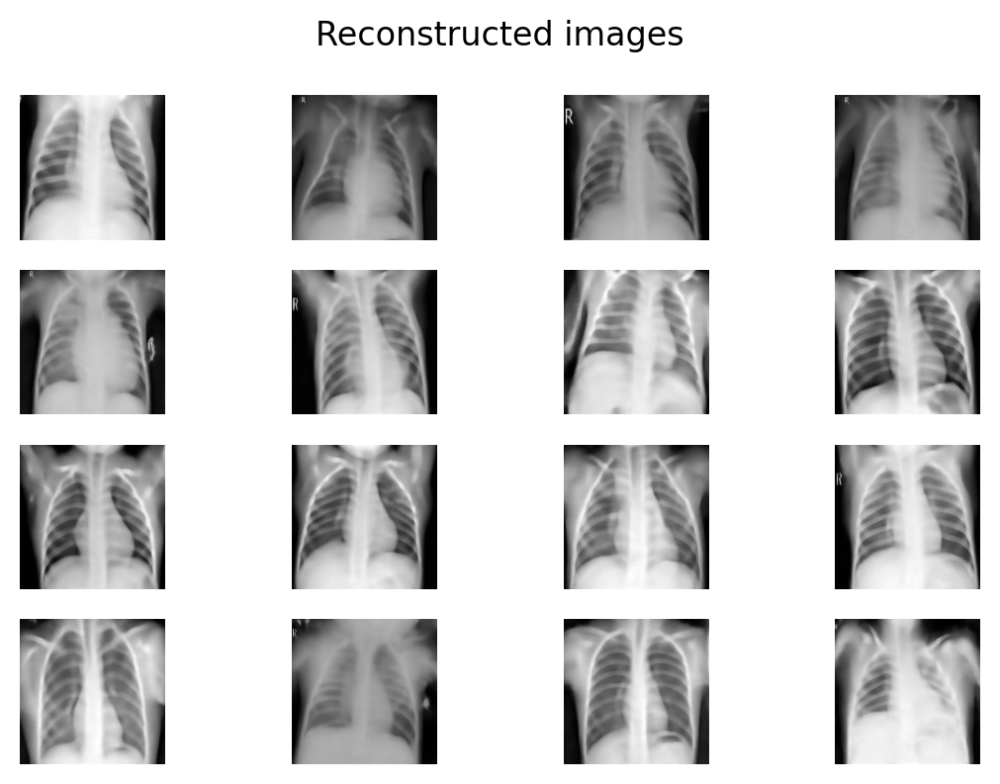

In [40]:
for images in dataloader:
    pass # TODO
    break

And the generation ability:

Generated images shape: torch.Size([16, 1, 224, 224])


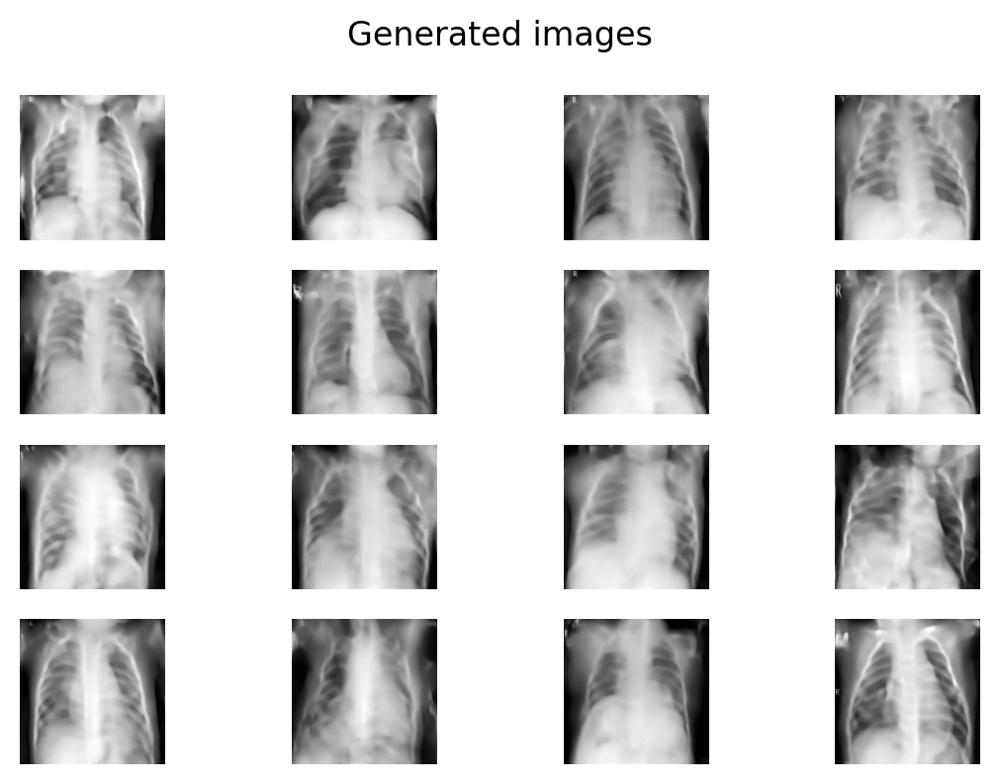

In [41]:
for images in dataloader:
    pass #TODO
    break


You can observe that the images are reconstructed quite well. However, the generated images contain a lot of artifacts and it can be clearly seen that they are unreal. The reason for this is the irregular latent space that we are going to discuss during the next part of the notebook - the Variational Autoencoder. You are going to visualize the latent spaces during Laboratory 9.

Finally, save the model state dict to your Google Drive. It will be required during the next laboratory:

In [42]:
pass # TODO

## Part III - Variational Autoencoder

The Autoencoder generated just a random images. This is connected with with "empty holes" in the latent spaces. The network is unable to generate new images from the space between the aforeseen embeddings. You will visualize this during next laboratory, now you are going to solve this by implementing the Variational Autoencoder (VAE).

Please refer to the lecture or read: https://medium.com/geekculture/variational-autoencoder-vae-9b8ce5475f68

You are going to use almost exactly the same architecture as for the Autoencoder, however, this time you are going to add another layer between the encoder and the decoder. You should add two Linear layers mapping from the 256-dimensional embedding into two 256-dimensional vectors: the mean and the variance. Then you are going to define a normal distribution using these vectors (see tc.distributions.Normal) and sample a new vector from the defined distribution. The generated vector is going to be the the input to the decoder.

Refer to the description above and the provided reference and modify the Autoencoder architecture into the Variational Autoencoder:

In [49]:
class VariationalAutoEncoder(tc.nn.Module):
    def __init__(self):
        super(VariationalAutoEncoder, self).__init__()
        pass # TODO

    def encode(self, x):   #TODO
      return latent_space

    def decode(self, latent_space): # TODO
      return x

    def generate(self, num_samples, device="cpu"):
        pass # TODO

    def forward(self, x):
      return self.decode(z), z, mean, std # pass TODO (return reconstructed image, embedding after reparmetrization, mean and std of the normal distribution)


Again, check whether the inputs are propagated correctly:

In [50]:
vae_model = VariationalAutoEncoder()
for images in dataloader:
    output, _, _, _ = vae_model(images)
    print(f"Output shape: {output.shape}")
    generated_images = vae_model.generate(images.size(0))
    print(f"Generated images shape: {generated_images.shape}")
    break

Output shape: torch.Size([16, 1, 224, 224])
Generated images shape: torch.Size([16, 1, 224, 224])


Reimplement the training loop. Now there will be two weighted terms in the objective function (see previous image registration task) - one responsible for the evaluation the reconstruction quality, and a second one responsible for enforcing a given distribution within the latent space. You are going to use the Kullback-Leiber divergence implemented below. 

Implement the training loop:

In [51]:
def training(model, dataloader, reconstruction_function, distribution_function, lambda_distribution, 
             optimizer, num_epochs, logger, device):
    pass # TODO

Now initialize the training parameters:

In [61]:
def kld(z, mean, std):
    """
    Direct KL divergence (for all-sized batches)
    """
    p = tc.distributions.Normal(tc.zeros_like(mean), tc.ones_like(std))
    q = tc.distributions.Normal(mean, std)
    kl = tc.distributions.kl_divergence(q, p)
    kl = kl.mean()
    return kl 

learning_rate = 0.003
vae_model = VariationalAutoEncoder()
batch_size = 16
num_epochs = 100
parameters = vae_model.parameters()
optimizer = tc.optim.Adam(parameters, lr=learning_rate)
device = "cuda:0"
logger = SummaryWriter("/content/logs/VAE", comment="VariationalAutoEncoder")
reconstruction_function = lambda a, b: tc.mean((a-b)**2)
distribution_function = kld
lambda_distribution = 0.003

dataset = XRayDataset(data_path, csv_path)
dataloader = tc.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)

Initialize the Tensorboard:

In [ ]:
# TODO

And run the training:

In [62]:
training(vae_model, dataloader, reconstruction_function, distribution_function, lambda_distribution, optimizer, num_epochs, logger, device)

Dataset size: 6432
Current epoch: 0
Current training epoch loss: 0.0023095656788110993
Current training epoch r_loss: 0.0017306235881258192
Current training epoch d_loss: 0.19298069508959406
Current epoch: 1
Current training epoch loss: 0.0023114290488049833
Current training epoch r_loss: 0.001743856605793354
Current training epoch d_loss: 0.18919081415109967
Current epoch: 2
Current training epoch loss: 0.0022981280683359103
Current training epoch r_loss: 0.001735185505822301
Current training epoch d_loss: 0.18764751975364352
Current epoch: 3
Current training epoch loss: 0.0023107024318589574
Current training epoch r_loss: 0.0017480398076516923
Current training epoch d_loss: 0.18755420593924782
Current epoch: 4
Current training epoch loss: 0.002307867231681498
Current training epoch r_loss: 0.0017475454876343002
Current training epoch d_loss: 0.1867739131201559
Current epoch: 5
Current training epoch loss: 0.0022874178320855198
Current training epoch r_loss: 0.0017305609775331817
Curr

Implement visualization of the reconstruced and generated images as before:

Output shape: torch.Size([16, 1, 224, 224])


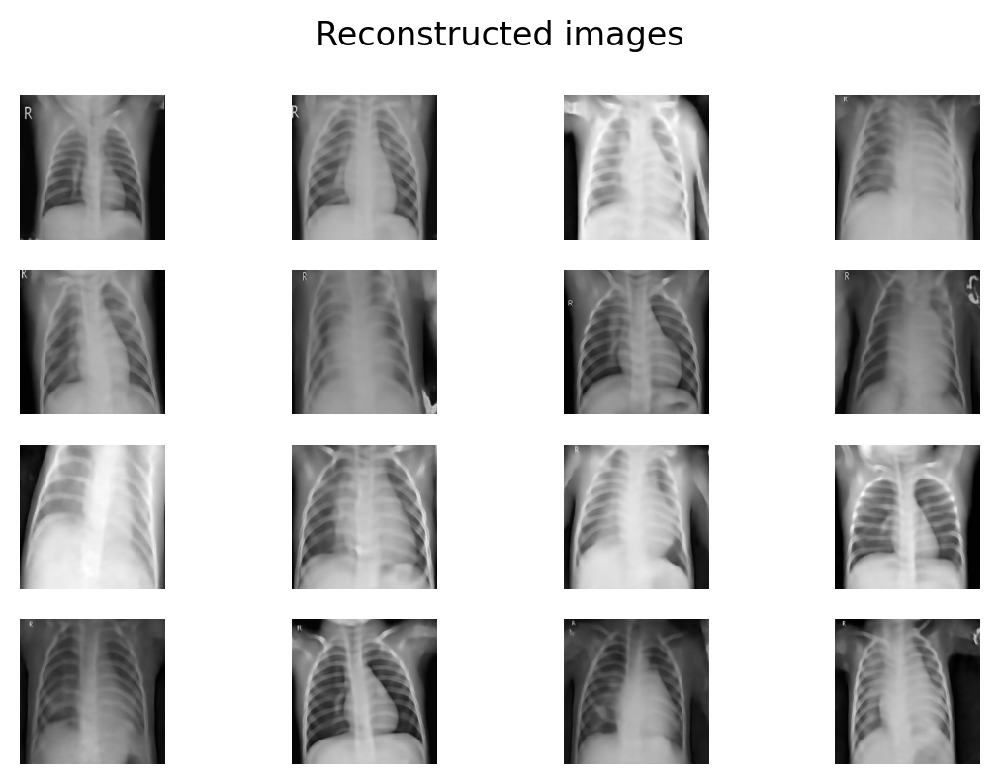

In [63]:
for images in dataloader:
    pass # TODO
    break

Generated images shape: torch.Size([16, 1, 224, 224])


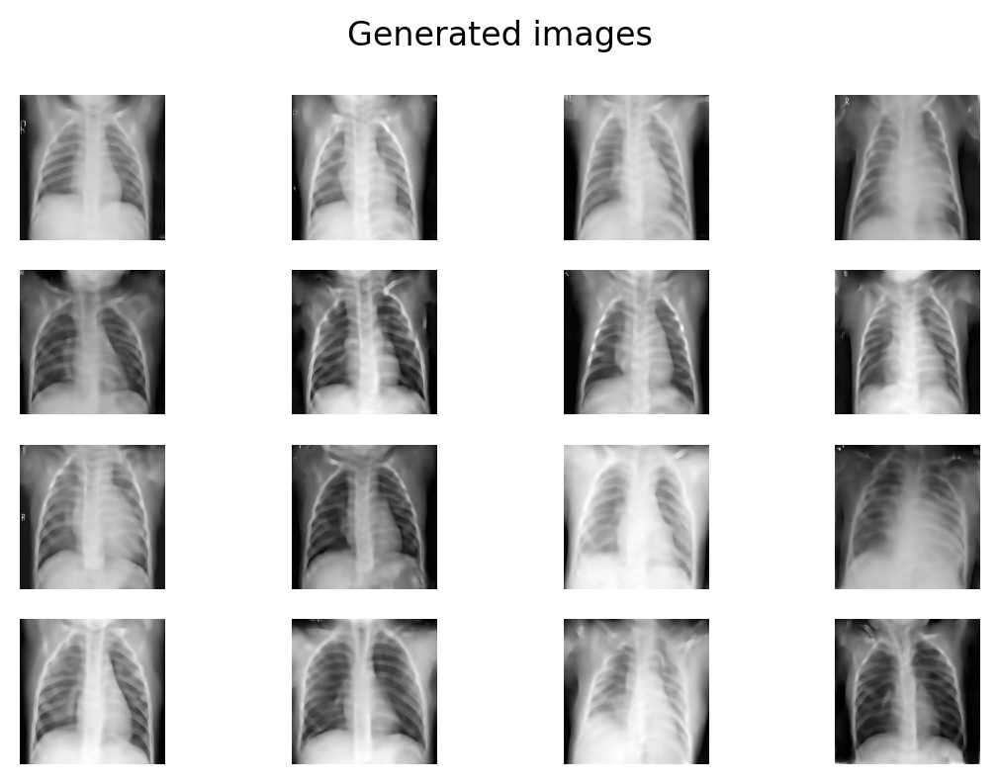

In [72]:
for images in dataloader:
    pass #TODO
    break


And save the state dictionary of your model (to be used during the Laboratory 9):

In [73]:
pass # TODO

Are the images better than the ones from the Autoencoder? They are, however, they are still not perfect. The generated images are blurry and still imperfect (see ribs) - this is actually a common problem with the vanilla VAE connected with the objective function formulation. There are other solutions (e.g. softIntroVAE, GANs or diffusion-based models) that generate more realistic images. GANs will be briefly explored in the next notebook.

## Conclusion

This is the end of Laboratory 8. You should be now familiar with:
<ol>
  <li> Basics of the generative networks.
  <li> The basic principles behind Autoencoders (AE) and Variational Autoencoders (VAE).
  <li> The fact that latent space exists and it important (AE does not work for image generation, while vanilla variational autoencoders produce blurry images).
</ol>

Note that during this laboratory, similarly to the previous one, you implemented the unsupervised training. You did not use any labels to generate the new training cases. In general, this particular task is an example of so called self-supervised learning. We are going to talk about it further during the Laboratory 9.

We will continue the topic during the Laboratory 9. It will be dedicated to exploring the latent spaces and to implementing the Generative Adversarial Networks (GANs).

To take part in Laboratory 9 it is mandatory to complete the Laboratory 8 and save the trained models because they will be required during the first part of the next notebook.